# Laboratory #08 : Image Segmentation using Handcrafted Features

At the end of this laboratory, you would get familiarized with

*   Segmentation using SLIC and Quickshift

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   You will have to mount your drive if you need to access images.

---

In [1]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)

from skimage import color, data, io, segmentation
import numpy as np
import glob
from pathlib import Path
import matplotlib.pyplot as plt

In [2]:
def plotImages(images, grid=(2, 2), figsize=(15, 9), **kwargs):
    f, ax = plt.subplots(grid[0], grid[1], figsize=figsize)
    for imageIdx, (title, image) in enumerate(images.items()):
        if grid[0] == 1:
            ax[imageIdx].set_title(title)
            ax[imageIdx].imshow(image, **kwargs)
            ax[imageIdx].axis('off')
        else:
            ax[imageIdx//grid[1]][imageIdx%grid[1]].set_title(title)
            ax[imageIdx//grid[1]][imageIdx%grid[1]].imshow(image, **kwargs)
            ax[imageIdx//grid[1]][imageIdx%grid[1]].axis('off')
    return f, ax

# SLIC (Simple Linear Iterative Clustering)

*   What is the underlying algorithm for SLIC?
*   Explain SLIC algorithm in detail

**Solution**
The underlying algorithm for SLIC is a special case of k-means.

The SLIC algorithm works by generating superpixels clustering pixels based on their color similarity and proximity in the image plane. The pixels are clusterized according to the features \[R, G, B, x, y\]. The distance measure used in the clustering algorithm is not the euclidean distance as unlike R, G, B which are easily normalizable, x and y's normalization depends on the image Size in the x and y axis. Because of that the distance is defined as:

$D_s = d_{RGB} + \frac{m}{S}d_{xy}$

Where $m$ is a parameter that controls the compactness of the superfilter and $S$ is the grid interval in the image as defined by:

$S = \sqrt{\frac{N}{K}}$

where $N$ is the number of pixels in the image and $K$ is the approximate number of equal-size superpixels to obtain from SLIC.

The algorithm is the following as described in [SLIC SuperPixels' Paper](https://infoscience.epfl.ch/record/149300)

**Algorithm Efficient superpixel segmentation**

1. Initialize cluster centers $Ck = [lk, ak, bk, xk, yk]^T$ by sampling pixels at regular grid steps S.
2. Perturb cluster centers in an n × n neighborhood, to the lowest gradient position.
3. **repeat**
    4. **for** each cluster center Ck **do**
        5. Assign the best matching pixels from a 2S × 2S square neighborhood around the cluster center according to the distance measure.
    6. **end for**
    7. Compute new cluster centers and residual error E {L1 distance between previous centers and recomputed centers}
8. **until** E ≤ threshold
9. Enforce connectivity.

*   Load coffee image from the data module and perform SLIC with the default parameters.
*   Plot the original image and the SLIC segments using matplotlib subplot.
*   Hint: 
    *   The labels could be visualized using mark_boundaries function available in segmentation module.
    *   All segmentation algorithms are available in the segmentation module.

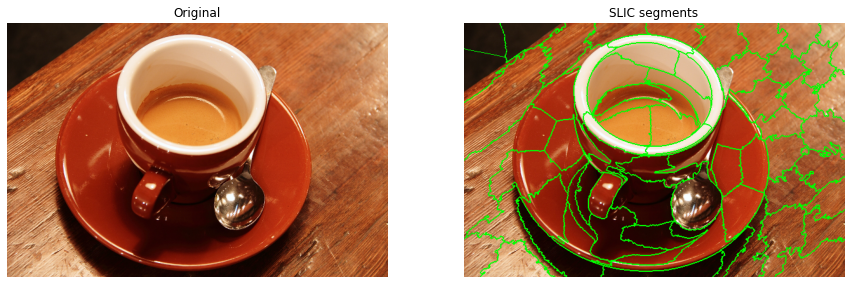

In [3]:
coffee = data.coffee()
default_slic = segmentation.slic(coffee)

images = {'Original': coffee,
         'SLIC segments': segmentation.mark_boundaries(coffee, default_slic, color=(0,1,0))}

f, ax = plotImages(images, grid=(1, 2))
plt.show()

## Number of Segments

*   Vary the parameter n_segments in powers of 2 starting from 1 to 10.
*   Plot the labels using matplotlib subplot

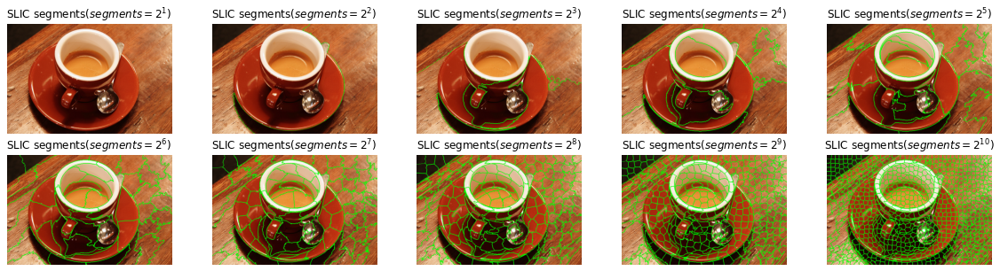

In [4]:
images = {}

for n in range(1, 11):
    slic = segmentation.slic(coffee, n_segments=2**n)
    images['SLIC segments($segments=2^{%i}$)' % n] = segmentation.mark_boundaries(coffee, slic, color=(0,1,0))
    
f, ax = plotImages(images, grid=(2, 5), figsize=(20, 5))
plt.show()

*   What do you infer with the results of different segments?

**Solution**

The `n_segments` parameter represents the approximate number of labels in the segmented output image (the number of K clusters of the K-means). Therefore, it should correspond to the expected number of regions that we expect to segment. Additionaly. it directly affects the scaling factor in the distance calculation. Because of that, the bigger the value of `n_segments`, the bigger contribution of the spatial distance to the distance metric of the algorithm. 

Even if you we cannot accurately select a concrete number of segments, we can priorly assume that the appropriate number should not reach such a high number as $2^{10} = 1024$, or an extremely low number like $2^{1} = 2, or  \   2^{2} = 4$. We can assert those assumptions with the results obtained with low or high number of segments, as there are too much segments or too few.

Furthermore, we can infer that the most reasonable number of segments should lie in the middle, where $2^{4} = 16$ looks like the best fit.

When the parameter is small, the color components get a lot more relevance in the clustering algorith while when the `n_segments` variable is big, the position distance has more relevance than the color distance. 

As a consequence, it can be appreciated that when the value of the parameter is small, the clusters tend to group similar colours regardless of the closeness of them while, when the parameter number is big, the image is segmented to what closely resembles a equispaced grid, as the color has little relevance.

## Compactness

*   What do you infer from the parameter compactness?

**Solution**

The `compactness` parameter trades off color similarity or proximity and space proximity (ratio between spatial and color parameters). Higher values give more weight to space proximity, making superpixel shapes more square/cubic. This parameter depends strongly on image contrast and on the shapes of objects in the image.

Therefore, if the idea is to segment the image based on color similarity, we shall choose a low value of compactness while, if we expect the segmentation to be much more 'squared' (as a grid), we shall choose higher values.

The `compactness` value is the $m$ value shown in the previous equations.

*   Fixing the n_segments as 16, vary the compactness from 10 to 100 with a step size of 10
*   Plot the labels using matplotlib subplot

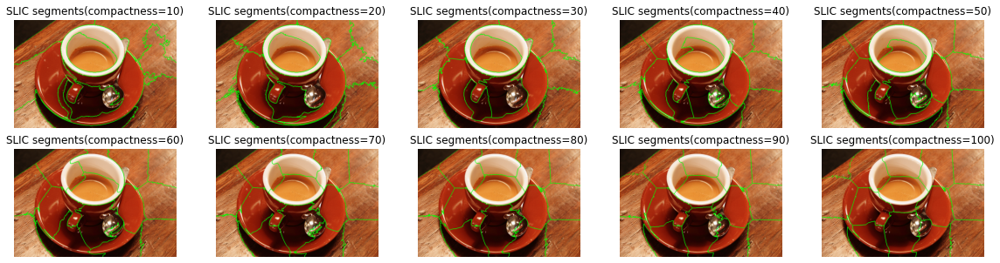

In [5]:
images = {}

for n in range(10, 101, 10):
    slic = segmentation.slic(coffee, n_segments=16, compactness=n)
    images[f'SLIC segments(compactness={n})'] = segmentation.mark_boundaries(coffee, slic, color=(0,1,0))

f, ax = plotImages(images, grid=(2, 5), figsize=(20, 5))
plt.show()

*   Fixing the n_segments as 16, vary the compactness from 10^-6 to 10^3
*   Plot the labels using matplotlib subplot

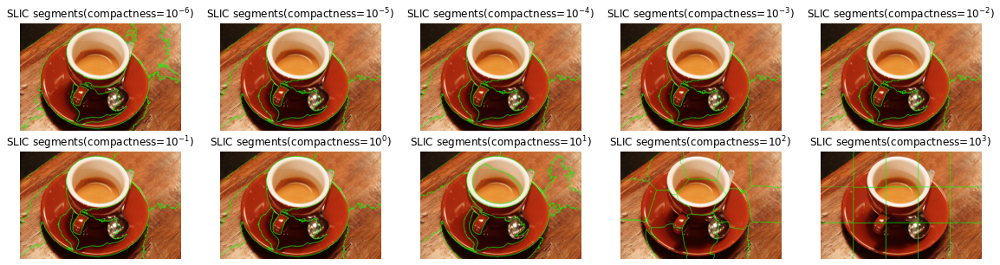

In [6]:
images = {}

for n in range(-6, 4):
    slic = segmentation.slic(coffee, n_segments=16, compactness=10**n)
    images["SLIC segments(compactness=$10^{%i}$)" % n ] = segmentation.mark_boundaries(coffee, slic, color=(0,1,0))

f, ax = plotImages(images, grid=(2, 5), figsize=(20, 5))
plt.show()

*   What happens with the change in compactness value?
*   What is the relationship between compactness and n_segment?

**Solution**

- As we increase the compactness value, the color/spatial proximity varies, taking less into account the color proximity of the segment and increasing the importance of the spatial proximity. We can see how all the points inside the segment share more or less the same color for low values of compactness, while for high values of compactness only spatial proximity matters, transforming the segments into a squared grid of 3x5.  

- While `n_segments` defines the number of segments to divide the image into, the `compactness` parameter describes how should the segmentation be performed, or at least which features should be imporant when segmenting the image. The number of segments should be "linked" with the number of different color regions (or the texture pattern) in case we chose a low value of compactness. In case we selected a high value of compactness to segment the image into a kind of grid, the `n_segments` parameter determines the shape of the grid. However, we can say that they are independent as they both contribute in the same way to the "squareness" of the clusters. `n_segments` contributes with the $\sqrt{K}$ and `compactness` contributes linearly to the relevance of the spatial distance in the distance calculation. However, n_segment squares the superpixels at the cost of the image being segmented into more chunks while compactness keeps the number of clusters as a constant.

*   Plot the original image, the SLIC labels and the SLIC contours with the best parameters you identified using matplotlib subplot.
*   What is the total number of segments?

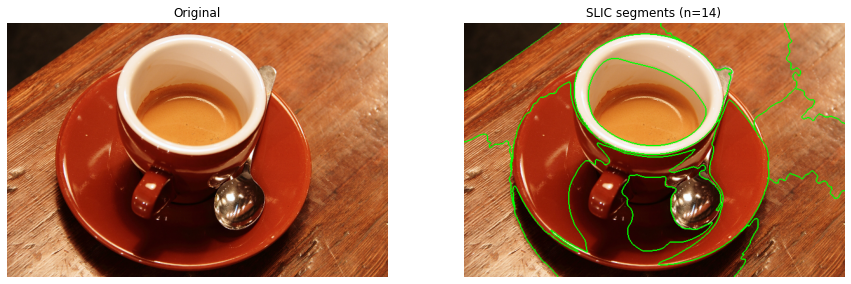

SLIC number of segments: 13


In [7]:
slic = segmentation.slic(coffee, n_segments=14, compactness=20, sigma=3)

images = {'Original': coffee,
         'SLIC segments (n=14)': segmentation.mark_boundaries(coffee, slic, color=(0,1,0))}

f, ax = plotImages(images, grid=(1, 2))
plt.show()

print(f"SLIC number of segments: {len(np.unique(slic))}")

# Quickshift Image Segmentation

*   What is the underlying algorithm for Quickshift segmentation?
*   Explain Quickshift algorithm in detail

**Solution**

- The underlying algorithm for Quickshift segmentation is the Mean shift algorithm, which is a non-parametric algorithm that clusters data iteratively by finding the densest regions (clusters) in a feature space. It belongs to the family of local mode-seeking algorithms.


- Quickshift Algorithm:

The mean shift algorithm seeks the “mode” or point of highest density of a data distribution.

1. Choose a search window size.  

2. Choose the initial location of the search window.  

3. Compute the mean location (centroid of the data) in the search window.  

4. Center the search window at the mean location computed in Step 3.  

5. Repeat Steps 3 and 4 until convergence.  



In the particular case of image segmentation using the Quickshift Algorithm:


1. Convert the image into tokens (via color, gradients, texture measures etc).  

2. Choose initial search window locations uniformly in the data.  

3. Compute the mean shift window location for each initial position.  

4. Merge windows that end up on the same “peak”or mode.  

5. The data these merged windows traversed are clustered together.  


Given an image, the algorithm calculates a forest of pixels whose branches are labeled with a distance value. This specifies a hierarchical segmentation of the image, with segments corresponding to subtrees. Useful superpixels can be identified by cutting the branches whose distance label is above a given threshold (the threshold can be either fixed by hand, or determined by cross validation).


For each pixel (x,y), quick shift regards $(x,y,I(x,y))$ as a sample from a d + 2 dimensional vector space. It then calculates the Parzen density estimate (with a Gaussian kernel of standard deviation $\sigma$)

$E(x,y) = P(x,y,I(x,y)) = \sum_{x'y'} \frac{1}{(2\pi\sigma)^{d+2}} \exp \left( -\frac{1}{2\sigma^2} \left[ \begin{array}{c} x - x' \\ y - y' \\ I(x,y) - I(x',y') \\ \end{array} \right] \right)$

Then quick shift construct a tree connecting each image pixel to its nearest neighbor which has greater density value. Formally, write $(x',y') >_P (x,y)$ if, and only if, $P(x',y',I(x',y')) > P(x,y,I(x,y))$

Each pixel (x, y) is connected to the closest higher density pixel parent(x, y) that achieves the minimum distance in $\mathrm{dist}(x,y) = \mathrm{min}_{(x',y') > P(x,y)} \left( (x - x')^2 + (y - y')^2 + \| I(x,y) - I(x',y') \|_2^2 \right)$

http://www.robots.ox.ac.uk/~vedaldi/assets/pubs/vedaldi08quick.pdf

*   Load coffee image from the data module and perform Quickshift with the default parameters.
*   Plot the original image, quickshift segments and slic segments using matplotlib subplot.

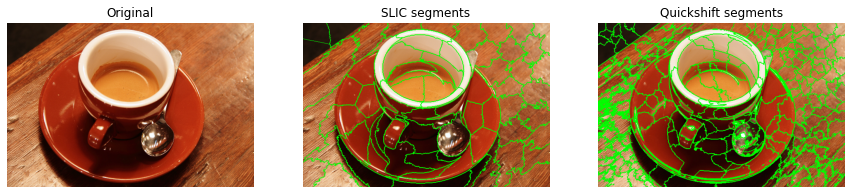

In [8]:
coffee = data.coffee()
default_slic = segmentation.slic(coffee)
default_quickshift = segmentation.quickshift(coffee)

images = {'Original': coffee,
         'SLIC segments': segmentation.mark_boundaries(coffee, default_slic, color=(0,1,0)),
         'Quickshift segments': segmentation.mark_boundaries(coffee, default_quickshift, color=(0,1,0))}

f, ax = plotImages(images, grid=(1, 3))
plt.show()

## Sigma

*   What does the parameter sigma represent?

**Solution**

The `sigma` parameter represents the width for Gaussian smoothing as preprocessing where zero means no smoothing.

*   Vary sigma values from 0 to 9 with a step size of 1

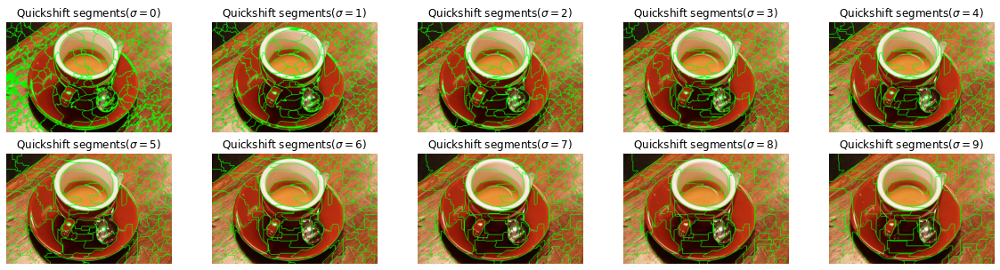

In [9]:
images = {}

for n in range(0, 10):
    quickshift = segmentation.quickshift(coffee, sigma=n)
    images[f'Quickshift segments($\sigma={n}$)'] = segmentation.mark_boundaries(coffee, quickshift, color=(0,1,0))
    
f, ax = plotImages(images, grid=(2, 5), figsize=(20, 5))
plt.show()

*   What do you infer with the changes in sigma?

**Solution**

As the `sigma` parameter increases, as well as the smoothing of the image, the contrast diminished inversely proportional. When the contrast decreases, the number of segments does too, as the color between regions that were separated before are much more similar and the algorithm decides to merge them into a single segment.

## Max dist

*   Vary the parameter max_dist in powers of 2 starting from 1 to 10.
*   Plot the segments using matplotlib subplot

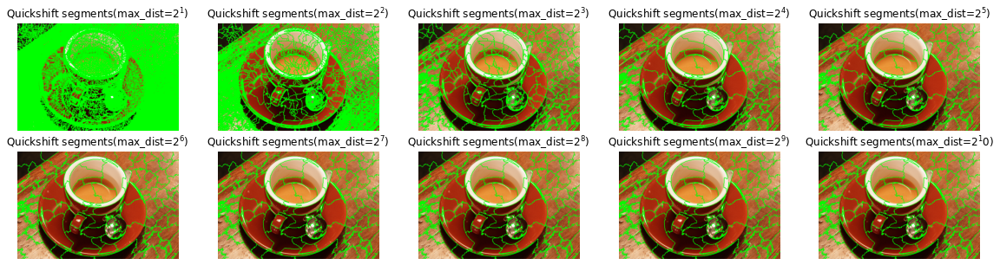

In [10]:
images = {}

for n in range(1, 11):
    quickshift = segmentation.quickshift(coffee, max_dist=2**n)
    images[f'Quickshift segments(max_dist=$2^{n}$)'] = segmentation.mark_boundaries(coffee, quickshift, color=(0,1,0))
    
f, ax = plotImages(images, grid=(2, 5), figsize=(20, 5))
plt.show()

*   What do you infer with the results of different segments?

**Solution**

The `max_dist` parameter indicates the level in which we may cut-off the hierarchical segmentation, thus selecting the number of clusters we want our image to be divided into. A higher number means a cut higher in the hierarchical segmentation, meaning fewer clusters.

We can observe this in the plot where, for a small number such as $2^{1} = 2$, we produce an absurd number of segments, that reduces the higher the number selected for the parameter. Therefore, we should pick a high number if we want the segmentation to be reasonable in terms of clusters.

*   Plot the original image, Quickshift segments and the Quickshift contours with the best parameters you identified using matplotlib subplot.
*   What is the total number of segments?

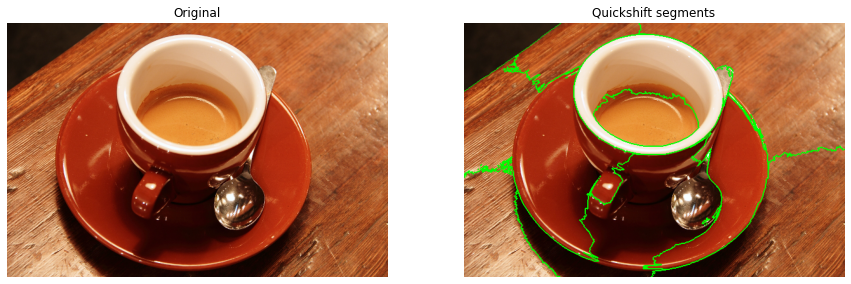

Quickshift number of segments: 10


In [11]:
quickshift = segmentation.quickshift(coffee, ratio=1.0, kernel_size=20, max_dist=1024)

images = {'Original': coffee,
         'Quickshift segments': segmentation.mark_boundaries(coffee, quickshift, color=(0,1,0))}

f, ax = plotImages(images, grid=(1, 2))
plt.show()

print(f"Quickshift number of segments: {len(np.unique(quickshift))}")

## Segmentation of Fruits

*   Load the folder 'images'
*   For each image, find the best segmentation parameters using both quickshift and slic
*   Plot the results using matplotlib subplot, where in each row, show the original image, slic segments and quickshift segments.
*   Show the number of segments in the title of the plot for each image.

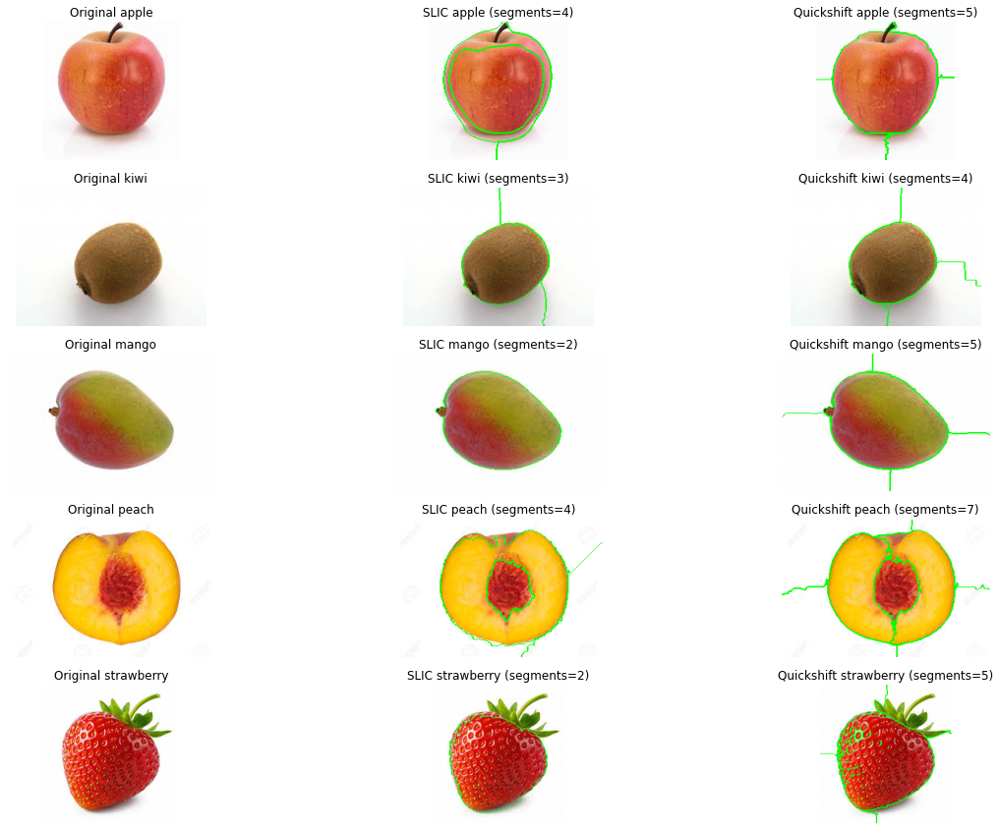

In [12]:
images = {}
fruits = [(Path(img).stem, io.imread(img)) for img in sorted(glob.glob("images/*"))]


slic_params = [
    {'n_segments': 3, 'compactness': 15, 'sigma': 5},
    {'n_segments': 4, 'compactness': 10},
    {'n_segments': 3, 'compactness': 20},
    {'n_segments': 9, 'compactness': 0.0001},
    {'n_segments': 3, 'compactness': 16},
]

quickshift_params = [
    {'ratio': 1.0, 'kernel_size': 15, 'max_dist': 30},
    {'ratio': 1.0, 'kernel_size': 15, 'max_dist': 256},
    {'ratio': 1.0, 'kernel_size': 15, 'max_dist': 80},
    {'ratio': 1.0, 'kernel_size': 15, 'max_dist': 50},
    {'ratio': 1.0, 'kernel_size': 15, 'max_dist': 1024},
]

for (fruit_args, slic_args, quickshift_args) in zip(fruits, slic_params, quickshift_params):
    title, fruit = fruit_args
    slic = segmentation.slic(fruit, **slic_args)
    quickshift = segmentation.quickshift(fruit, **quickshift_args)
    images[f'Original {title}'] = fruit
    images[f'SLIC {title} (segments={len(np.unique(slic))})'] = segmentation.mark_boundaries(fruit, slic, color=(0,1,0))
    images[f'Quickshift {title} (segments={len(np.unique(quickshift))})'] = segmentation.mark_boundaries(fruit, quickshift, color=(0,1,0))

f, ax = plotImages(images, grid=(5, 3), figsize=(20, 15))
plt.show()

*   For each of the image, do you find the segmentation proper? If not, what could be the possible reason?

**Solution**

- Mango: probably the easiest to segmentate. Both methods are able to segmentate correctly, although SLIC does it with less segments.  

- Stawberry: the red portion of the fruit is correcly segmented, but the green part is not. This is probably due to the shape of the small green leaves and their irregular shapes.

- Kiwi: Is correctly segmented, although taking more segments than it should be necessary.  

- Apple: SLIC is not able to segment it correctly as it found 2 segments at minumum (inner apple and outside countour). This is probably because of the illumination changes in the apple. Quickshift segments it correctly.  

- Peach: Both methods are able to correctly segment both the outside contour of the peach and the inner seed.

## Evaluating Segmentation 

*   How do you evaluate image segmentation?
*   What are the metrics commonly used?

**Solution**

- There's several ways to evaluate image segmentation: 

Good segmentation:

1. Regions should be uniform and homogeneous with respect to some characteristic(s)
2. Adjacent regions should have significant differences with respect to the characteristic on which they are uniform
3. Region interiors should be simple and without holes
4. Boundaries should be simple, not ragged, and be spatially accurate.

They can be based on:

1. Metrics based on color error Evaluation method ECW computes the intra-region color error as the proportion of misclassified pixels in an image. A misclassified pixel is defined as a pixel whose color error between its original color and the average color of its region is higher than a predefined threshold (Pixel Accuracy).
2. Metrics based on squared color error

There's several techniques to evaluate image segmentation:

- Pixel Accuracy: We can compare each pixel one by one with the ground truth mask. Not extremely useful if a large portion of the image is just the background.

- Jaccard's Index: In this accuracy metric, we compare the ground truth mask with the mask we create.

#### References

https://cs.slu.edu/~fritts/papers/seg_eval_survey_CVIU08.pdf

https://upcommons.upc.edu/bitstream/handle/2117/91116/PontMarquesPAMI2015.pdf


---

## **End of P8: Image Segmentation using Handcrafted Features**
Deadline for P8 submission in CampusVirtual is: **Thursday, the 3rd of December, 2020**